---
title: "Siren"
execute:
  echo: false
author: "Vannsh Jani and Viraj Vekaria"
date: "9/12/2023"
format:
  html:
    code-fold: true
jupyter: python3
---

# Implicit Neural representations using sinusoidal activation

# Audio compression

The reason we use the sine function as an activation function is because it is infinitely differentiable where as for a function like relu, the double derivative becomes zero. Let's try regenerating an audio file by mapping coordinates in the grid with amplitudes

In [12]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os
from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt
import time
import scipy.io.wavfile as wavfile
import io
from IPython.display import Audio
from IPython.display import Video
from IPython.display import HTML
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

device = "mps" if torch.backends.mps.is_available() else "cpu"

In [31]:
def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate


class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False,
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()

        self.net = []
        self.net.append(SineLayer(in_features, hidden_features,
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features,
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0,
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)

            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features,
                                      is_first=False, omega_0=hidden_omega_0))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [20]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

The following is the ground truth audio

In [ ]:
class AudioFile(torch.utils.data.Dataset):
    def __init__(self, filename):
        self.rate, self.data = wavfile.read(filename)
        self.data = self.data.astype(np.float32)
        self.timepoints = get_mgrid(len(self.data), 1)

    def get_num_samples(self):
        return self.timepoints.shape[0]

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        amplitude = self.data
        scale = np.max(np.abs(amplitude))
        amplitude = (amplitude / scale)
        amplitude = torch.Tensor(amplitude).view(-1, 1)
        return self.timepoints, amplitude


if not os.path.exists('gt_bach.wav'):
    !wget https://vsitzmann.github.io/siren/img/audio/gt_bach.wav
bach_audio = AudioFile('gt_bach.wav')

dataloader = DataLoader(bach_audio, shuffle=True, batch_size=1, pin_memory=True, num_workers=0)
audio_siren = Siren(in_features=1, out_features=1, hidden_features=256,
                    hidden_layers=3, first_omega_0=3000, outermost_linear=True)

rate, _ = wavfile.read('gt_bach.wav')

model_input, ground_truth = next(iter(dataloader))
Audio(ground_truth.squeeze().numpy(),rate=rate)



We are using a neural network with 3 hidden layers and each layer consisting of 256 neurons and we are using mean squared error loss function and optimizing it using Adam with a learning rate of 0.0001. We are training the neural network for a total of 1000 steps and displaying every 100th result. As can be seen in the following figures as the number of steps increases both the graphs converge.

Description of neural network


In [ ]:
audio_siren.to(device)

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=1, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.025424


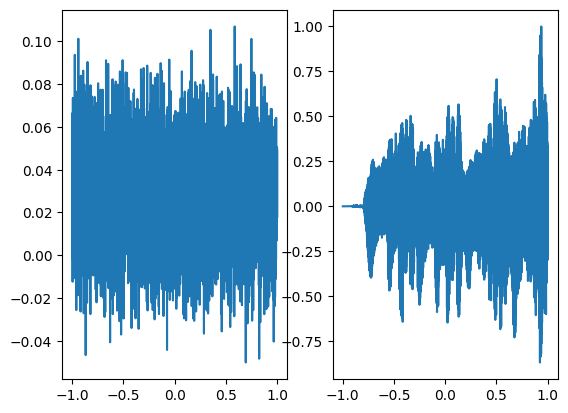

Step 100, Total loss 0.002972


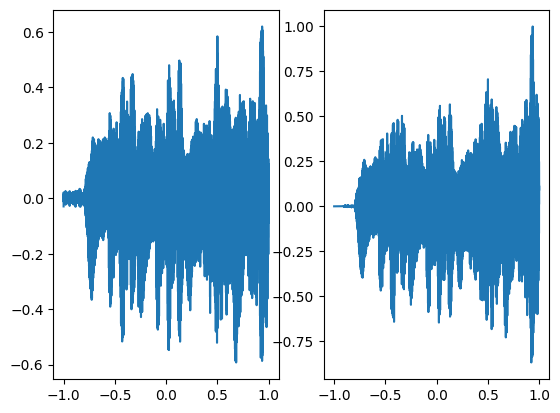

Step 200, Total loss 0.001123


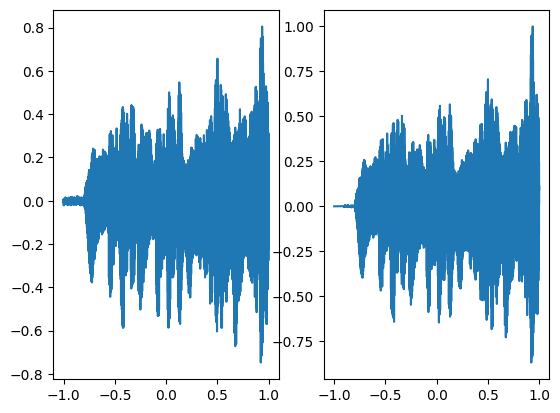

Step 300, Total loss 0.000861


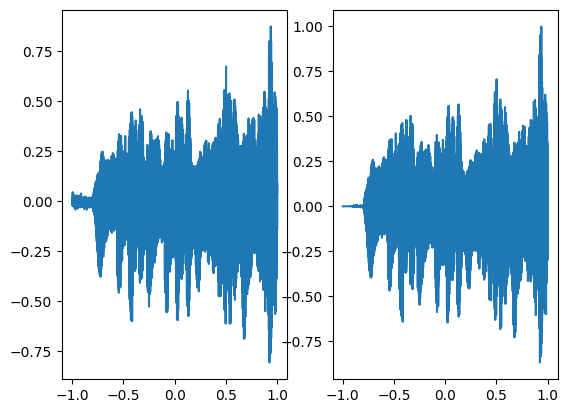

Step 400, Total loss 0.000702


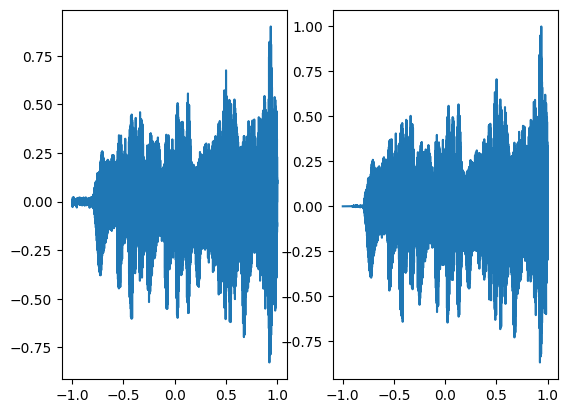

Step 500, Total loss 0.000586


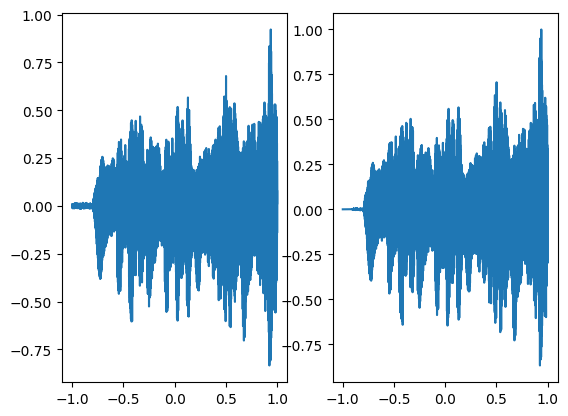

Step 600, Total loss 0.000535


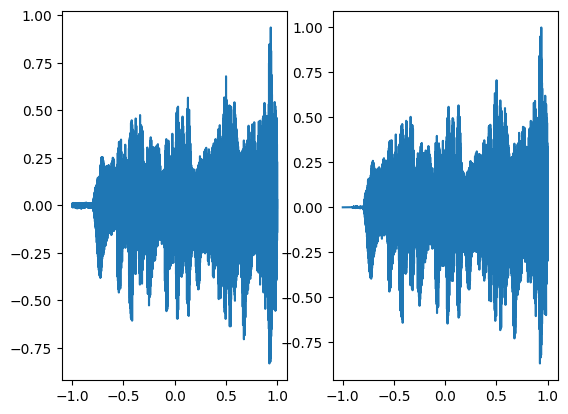

Step 700, Total loss 0.000538


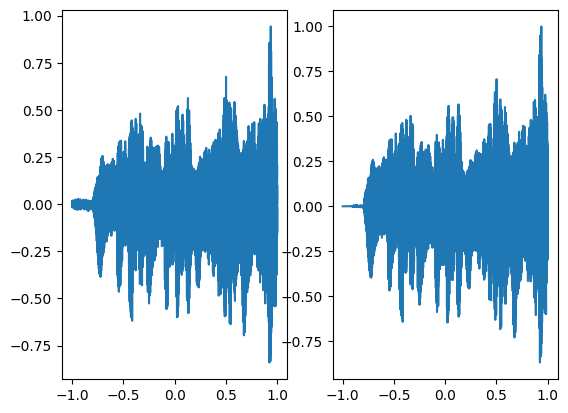

Step 800, Total loss 0.000665


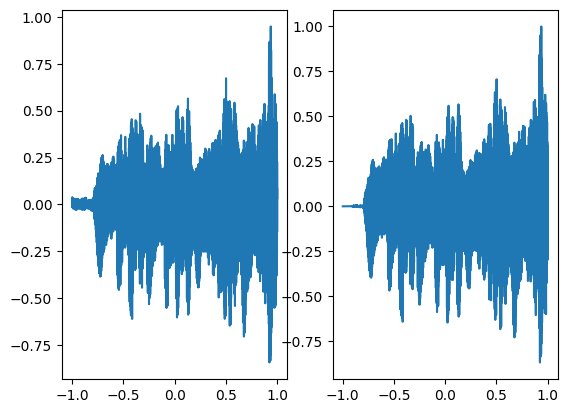

Step 900, Total loss 0.000362


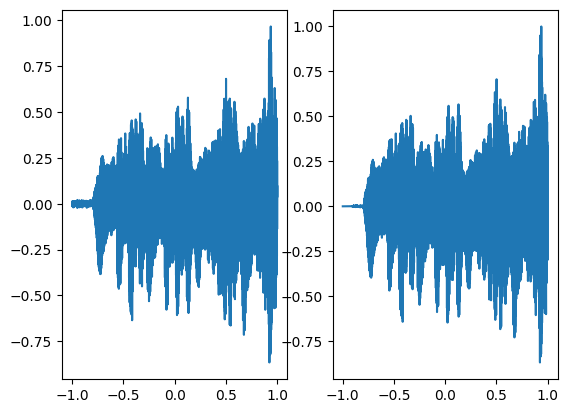

In [ ]:
total_steps = 1000
steps_til_summary = 100

optim = torch.optim.Adam(lr=1e-4, params=audio_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(device), ground_truth.to(device)

for step in range(total_steps):
    model_output, coords = audio_siren(model_input)
    loss = F.mse_loss(model_output, ground_truth)

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))

        fig, axes = plt.subplots(1,2)
        axes[0].plot(coords.squeeze().detach().cpu().numpy(),model_output.squeeze().detach().cpu().numpy(),label="siren")
        axes[1].plot(coords.squeeze().detach().cpu().numpy(),ground_truth.squeeze().detach().cpu().numpy(),label="Ground truth")
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

In the above graph the coordinates of the grid are squeezed to a single dimension (x-axis) and the corresponding model output is shown on the y-axis.

 Following is the audio regenerated using a neural network with sinusoidal activation

In [ ]:
initial_memory = torch.cuda.memory_allocated(device=device)
final_model_output, coords = audio_siren(model_input)
final_memory = torch.cuda.memory_allocated(device=device)
Audio(final_model_output.cpu().detach().squeeze().numpy(),rate=rate)

There is a little bit of noise in the above regenerated audio signal but overall has a good performance

Let's try using a different activation function such as relu and how well it can perform to regenerate audio and compare it with sinusoidal activation

Step 0, Total loss 0.032153


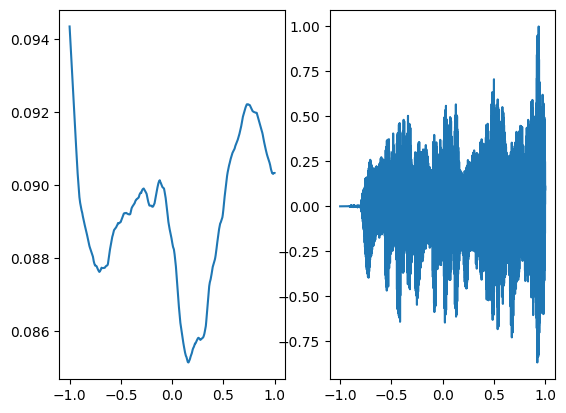

Step 100, Total loss 0.032153


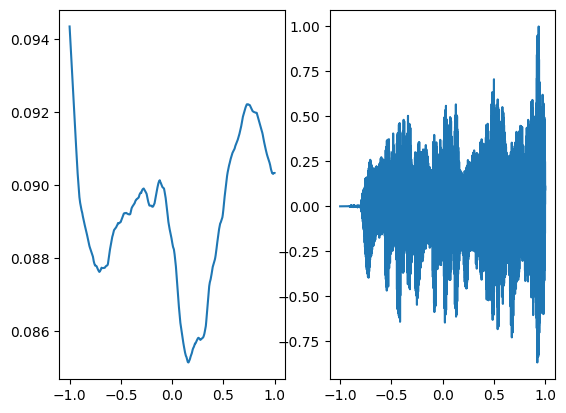

Step 200, Total loss 0.032153


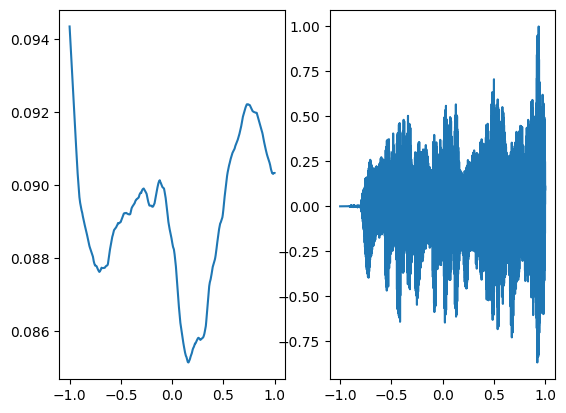

Step 300, Total loss 0.032153


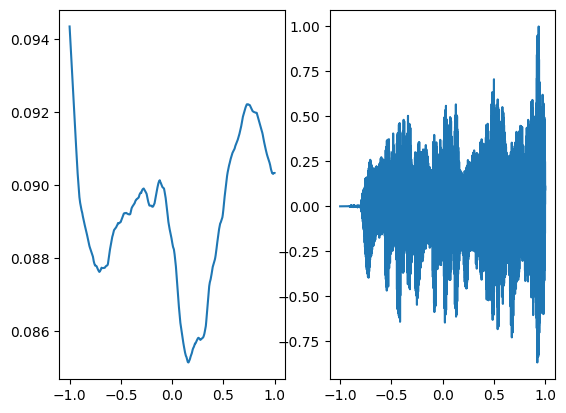

Step 400, Total loss 0.032153


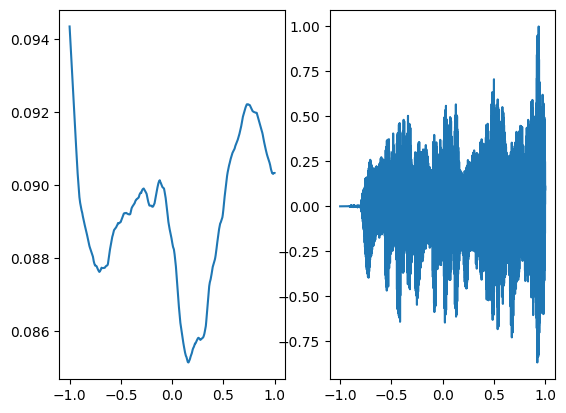

Step 500, Total loss 0.032153


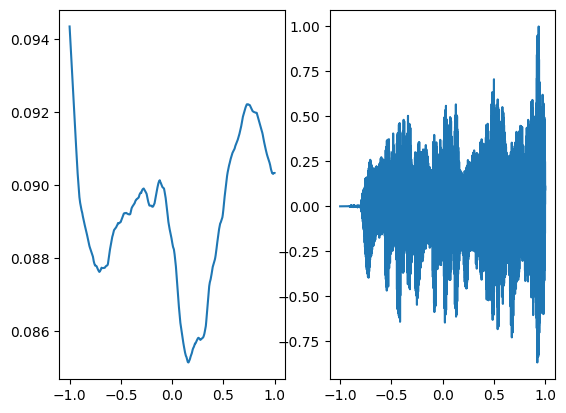

Step 600, Total loss 0.032153


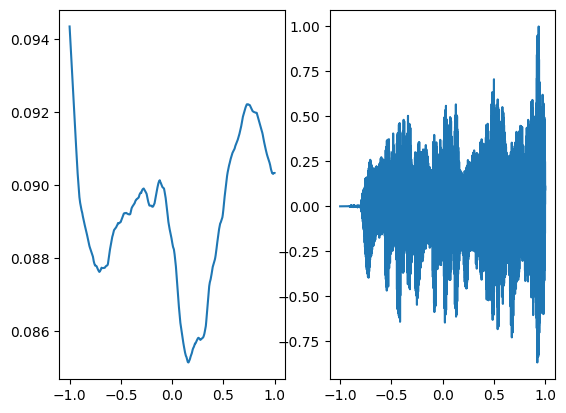

Step 700, Total loss 0.032153


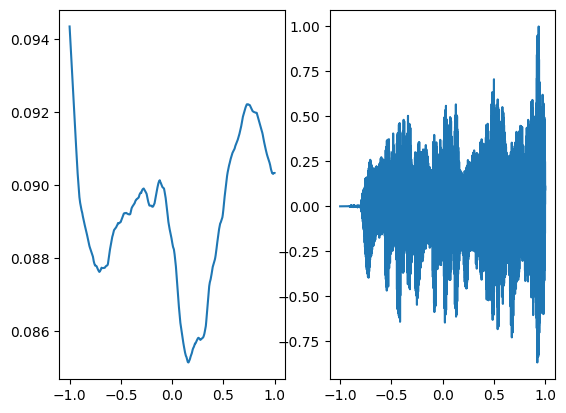

Step 800, Total loss 0.032153


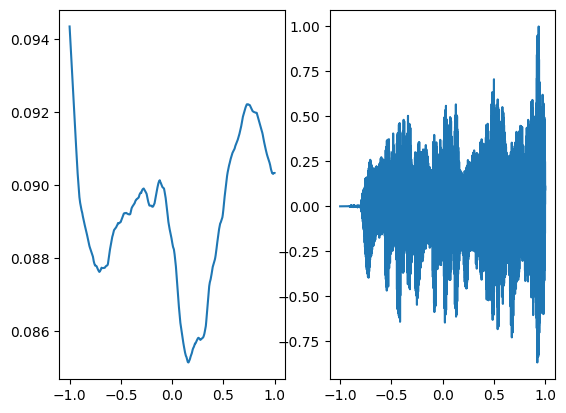

Step 900, Total loss 0.032153


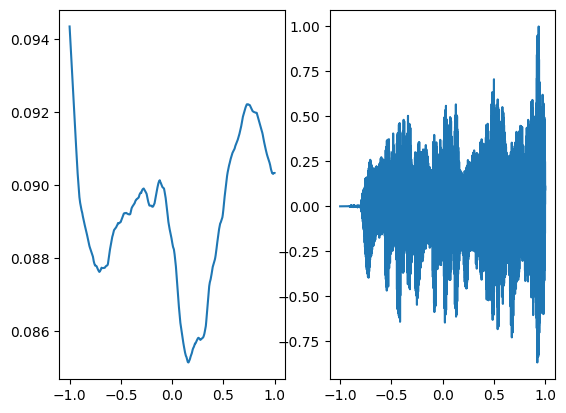

In [ ]:
model = nn.Sequential(
    nn.Linear(in_features=1, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=1)
)

total_steps = 1000
steps_til_summary = 100
model.to(device)
dataloader = DataLoader(bach_audio, shuffle=True, batch_size=1, pin_memory=True, num_workers=0)
model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(device), ground_truth.to(device)

optim = torch.optim.Adam(lr=1e-4, params=audio_siren.parameters())

for step in range(total_steps):
    model_output = model(model_input)
    loss = F.mse_loss(model_output, ground_truth)

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))

        fig, axes = plt.subplots(1,2)
        axes[0].plot(coords.squeeze().detach().cpu().numpy(),model_output.squeeze().detach().cpu().numpy())
        axes[1].plot(coords.squeeze().detach().cpu().numpy(),ground_truth.squeeze().detach().cpu().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

Following is the audio regenerated through relu activation which is not at all close to the ground truth

In [ ]:
final_model_output = model(model_input)
Audio(final_model_output.cpu().detach().squeeze().numpy(),rate=rate)

How much memory do we save through this compression technique?


In [ ]:
def get_file_memory(file_path):
    try:
        # Get the size of the file in bytes
        file_size = os.path.getsize(file_path)
        return file_size
    except FileNotFoundError:
        print("File not found.")
    except Exception as e:
        print("An error occurred:", str(e))


audio_file_path = 'gt_bach.wav'
memory_in_bytes = get_file_memory(audio_file_path)
print("Memory of audio file:", memory_in_bytes, "bytes")


Memory of audio file: 1232886 bytes


In [ ]:
pytorch_total_params = sum(p.numel() for p in audio_siren.parameters())
print(f"Number of parameters in the neural network are {pytorch_total_params}")

Number of parameters in the neural network are 198145


In [ ]:
from pathlib import Path

# 1. Create models directory
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

# 2. Create model save path
MODEL_NAME = "01_pytorch_workflow_model_0.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

torch.save(obj=audio_siren.state_dict(),
           f=MODEL_SAVE_PATH)
memory_model = get_file_memory(MODEL_SAVE_PATH)
print(f"Memory consumed by the neural network is {memory_model} bytes")

Memory consumed by the neural network is 796343 bytes


Hence, we can conclude that passing the network parameters instead of the audio file itself can save space.

# Image compression

For the sake of an example let's take the classic cameraman photo

In [28]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [29]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixels

This is the architecture used for modelling the image, it contains 3 hidden layers and 256 neurons in each layer using the adam optimizer with learning rate 1e-4.

In [32]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256,
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Now let us train SIREN model on our dataset i.e the image. The loss and the current state of the Network is displayed for every 50th element.

Step 0, Total loss 0.325293


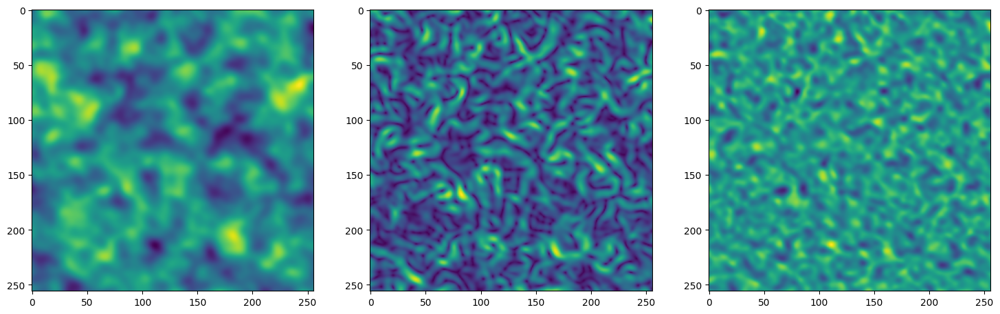

Step 50, Total loss 0.012300


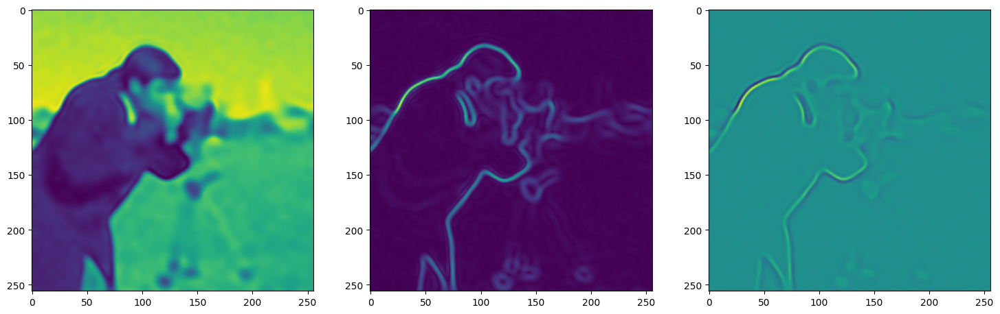

Step 100, Total loss 0.008443


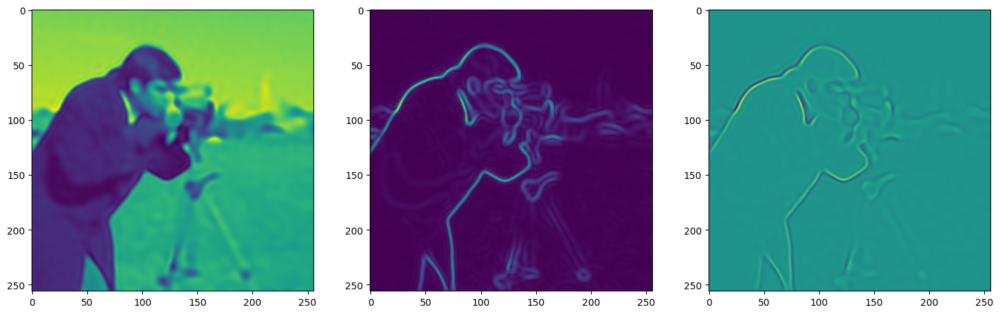

Step 150, Total loss 0.006012


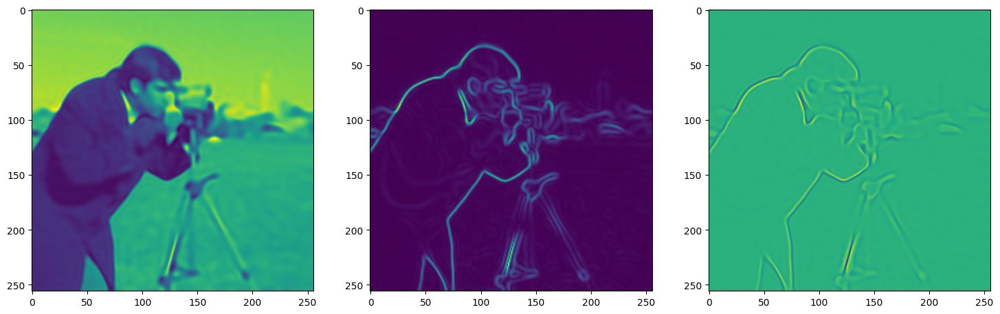

Step 200, Total loss 0.004077


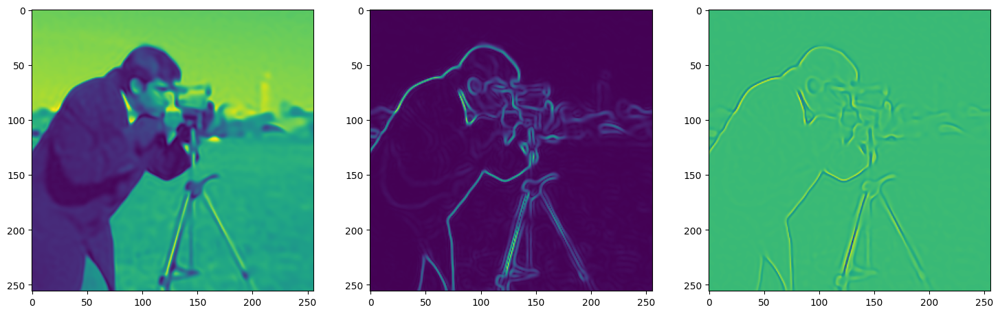

Step 250, Total loss 0.002673


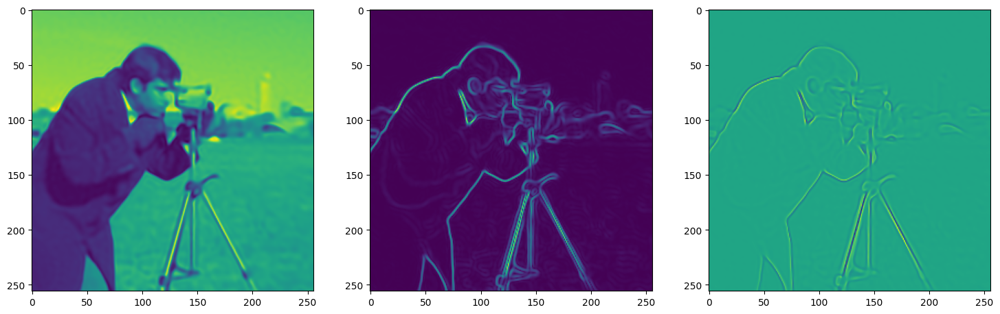

Step 300, Total loss 0.001977


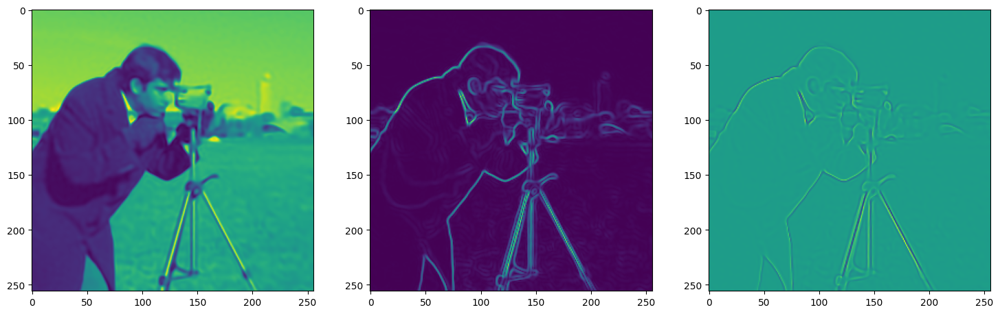

Step 350, Total loss 0.001566


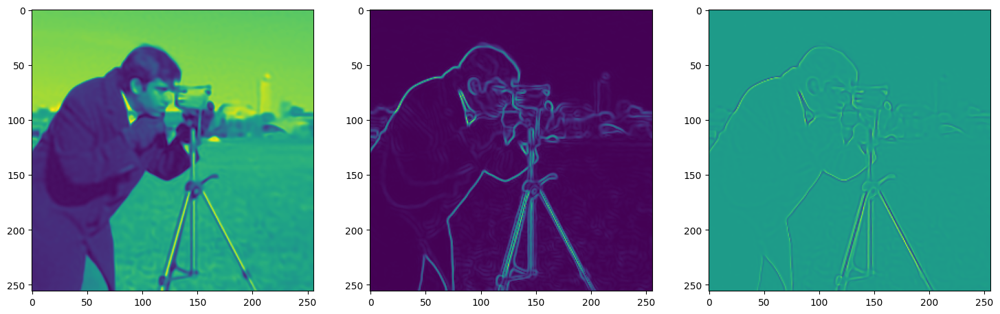

Step 400, Total loss 0.001294


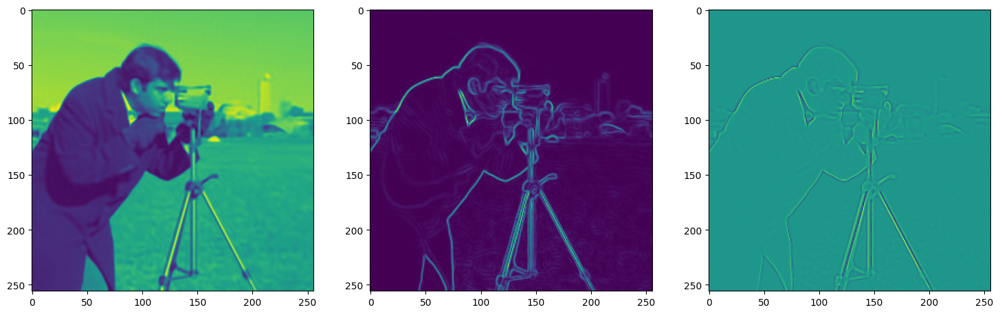

Step 450, Total loss 0.001094


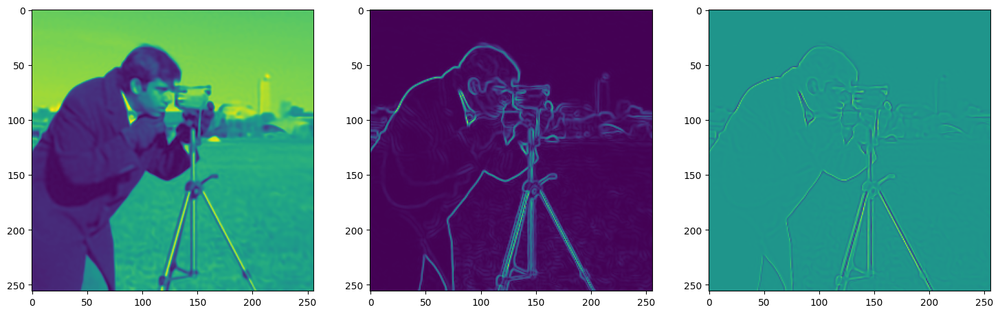

Step 500, Total loss 0.000939


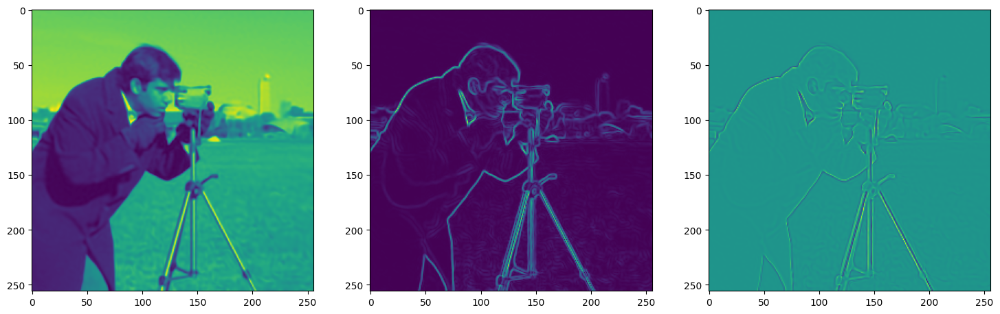

In [21]:
total_steps = 501 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 50

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

Let's see how ReLU works in this setting. This is the architecture for the Neural Network:


In [22]:
import torch
import torch.nn as nn
import numpy as np
from collections import OrderedDict

class ReLULayer(nn.Module):
    def __init__(self, in_features, out_features, bias=True):
        super().__init__()
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            self.linear.weight.uniform_(-np.sqrt(6 / self.linear.in_features),
                                          np.sqrt(6 / self.linear.in_features))

    def forward(self, input):
        return torch.relu(self.linear(input))


class Network(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False):
        super().__init__()

        self.net = []
        self.net.append(ReLULayer(in_features, hidden_features))

        for _ in range(hidden_layers):
            self.net.append(ReLULayer(hidden_features, hidden_features))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features),
                                              np.sqrt(6 / hidden_features))

            self.net.append(final_linear)
        else:
            self.net.append(ReLULayer(hidden_features, out_features))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)  # Allows taking derivatives w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            x = layer(x)

            if retain_grad:
                x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [23]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [24]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixels

In [25]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Network(in_features=2, out_features=1, hidden_features=256,
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

Network(
  (net): Sequential(
    (0): ReLULayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): ReLULayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.733969


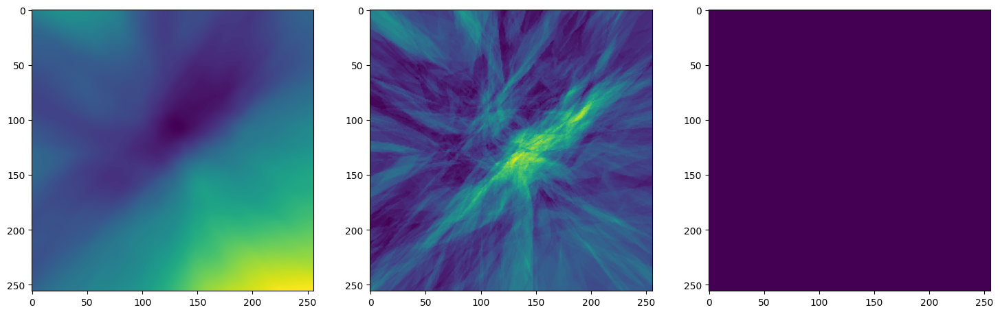

Step 50, Total loss 0.077224


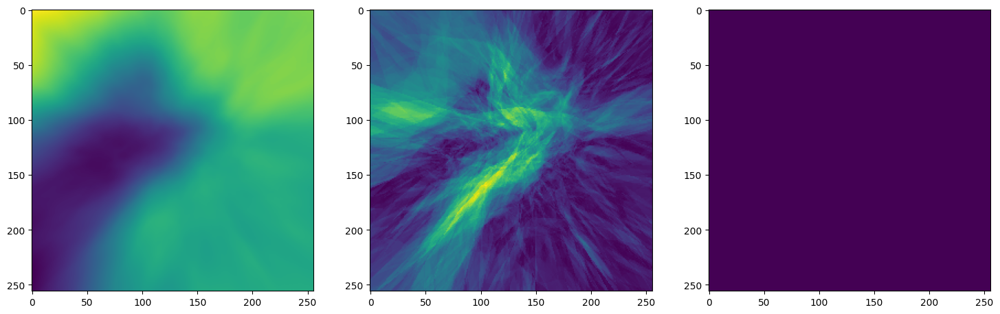

Step 100, Total loss 0.064925


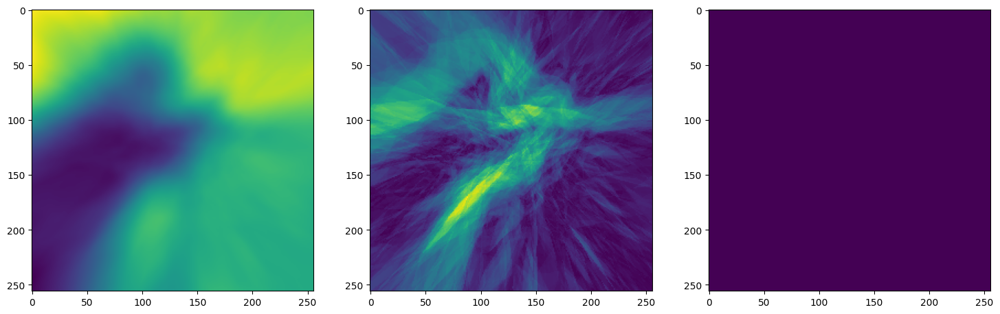

Step 150, Total loss 0.057928


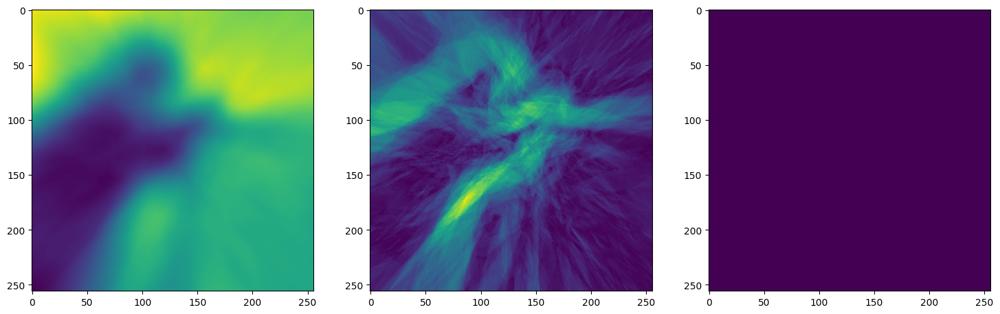

Step 200, Total loss 0.052542


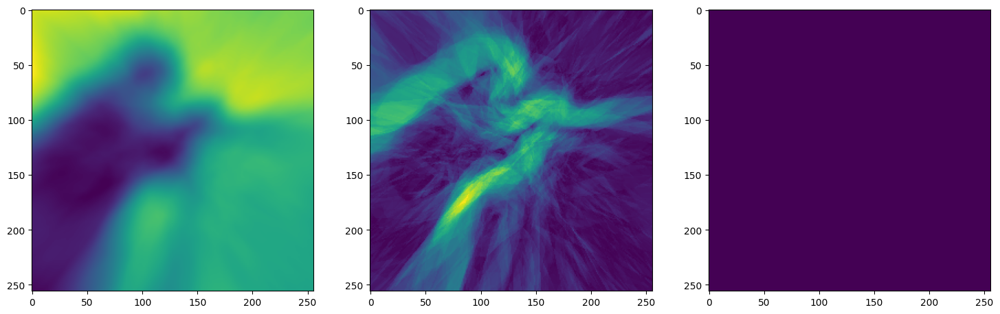

Step 250, Total loss 0.048083


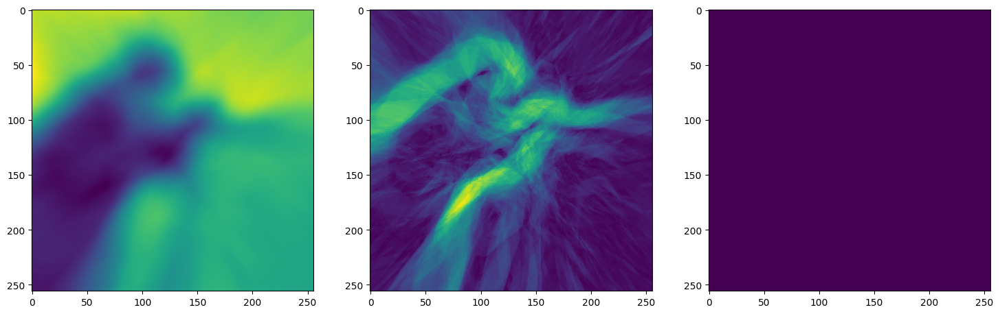

Step 300, Total loss 0.044299


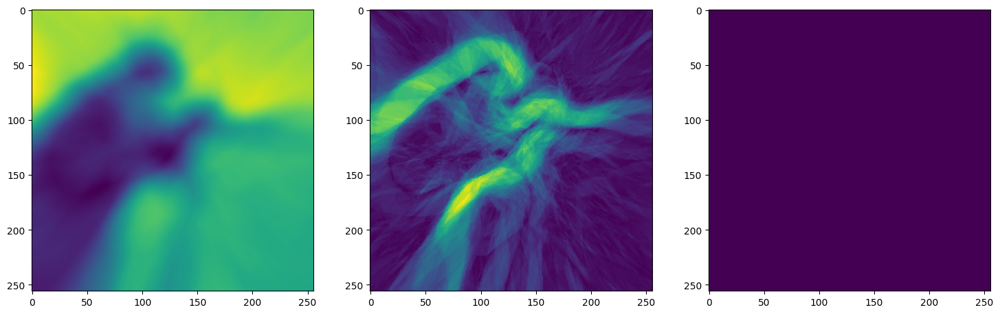

Step 350, Total loss 0.041403


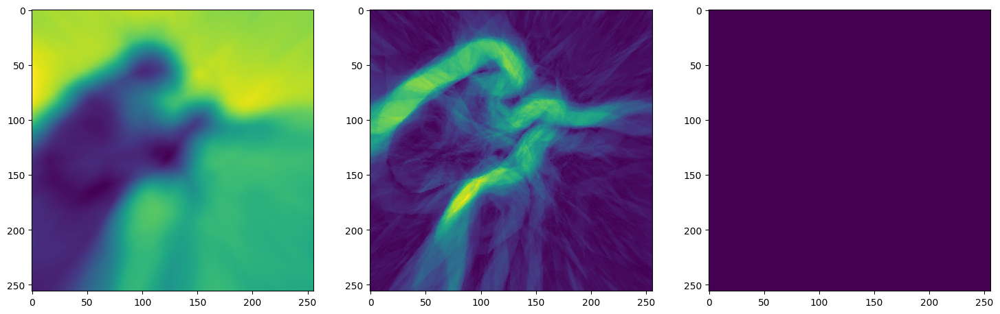

Step 400, Total loss 0.039117


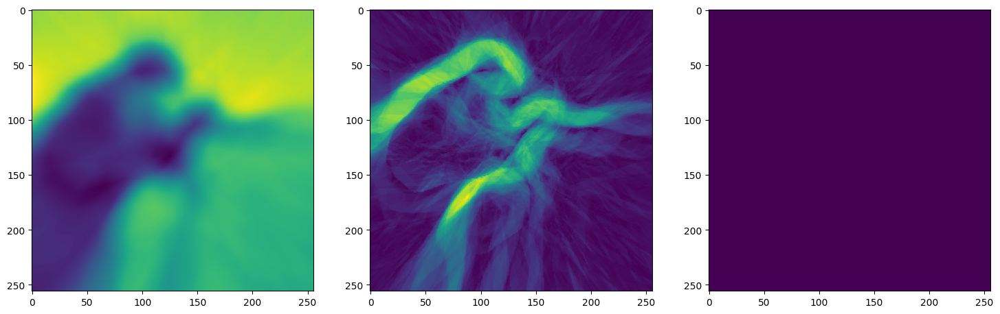

Step 450, Total loss 0.037259


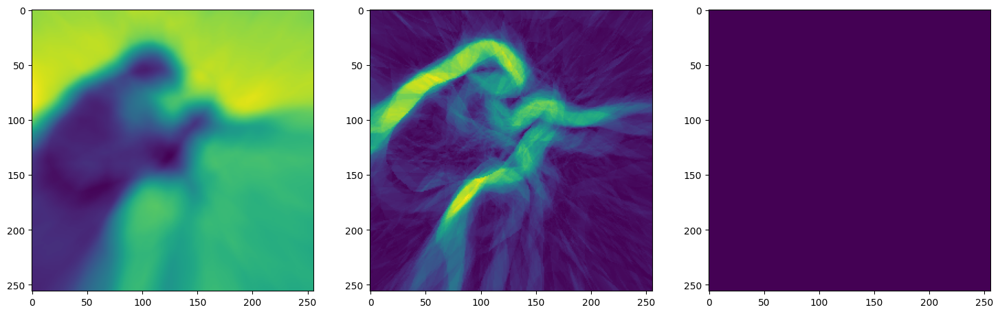

Step 500, Total loss 0.035712


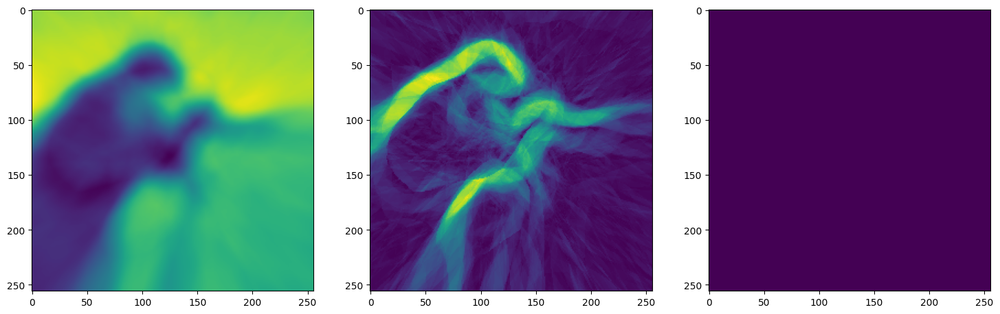

In [ ]:
total_steps = 501 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 50

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()

Note that the laplacian of the image generated by ReLU activation is constant (or you can say zero) because the second derivative of the ReLU function is zero, because it is a linear function. Hence, it does not perform well for transmitting signals.

Another takeaway for us was that the task of these kinds of Neural nets is to actually overfit over the data. By overfitting the data, it basically memorised the outputs for the given inputs. In generic Machine learning applications sinusoidal activation functions would not work at all.

This method is approximately 12 times better than the regular way of transmitting images. But the catch is that training the neural network for a single image of decent quality takes an hour on fairly strong computers. This renders this message of compression very unpractical. Hence, it is not used for real world data compression yet. If somehow the time required for training could be lowered, it would be quite usable in real life applications.